In [1]:
import numpy as np
import pandas as pd
import os
import shutil
import matplotlib.pyplot as plt
import numpy as np

In [2]:
output_dir = "/content/combined_files"
shutil.rmtree(output_dir, ignore_errors=True)
os.makedirs(output_dir, exist_ok=True)
print(f"Contents of {output_dir} cleared.")

Contents of /content/combined_files cleared.


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
import os
import shutil
import librosa
import soundfile as sf
dataset_path = "/content/drive/MyDrive/16000_pcm_speeches"
output_dir = "/content/combined_files"
shutil.rmtree(output_dir, ignore_errors=True)
os.makedirs(output_dir, exist_ok=True)
print(f"Contents of {output_dir} cleared.")
speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]
num_files_to_combine = 120
max_duration = 2 * 60
for speaker_folder in speaker_folders:
    speaker_folder_path = os.path.join(dataset_path, speaker_folder)
    wav_files = [f"{i}.wav" for i in range(num_files_to_combine)]
    combined_audio = []
    total_duration = 0
    for wav_file in wav_files:
        wav_file_path = os.path.join(speaker_folder_path, wav_file)
        if os.path.exists(wav_file_path):
            audio, sr = librosa.load(wav_file_path, sr=None)
            combined_audio.extend(audio)
            total_duration += librosa.get_duration(y=audio, sr=sr)
            if total_duration >= max_duration:
                break
        else:
            print(f"File {wav_file_path} does not exist. Skipping.")
    combined_audio = combined_audio[:int(max_duration * sr)]
    output_file_path = os.path.join(output_dir, f"{speaker_folder}_combined.wav")
    sf.write(output_file_path, combined_audio, sr)
    print(f"Combined audio for speaker {speaker_folder} saved.")
print("Combination complete. Combined files saved in:", output_dir)


Contents of /content/combined_files cleared.
Combined audio for speaker Benjamin_Netanyau saved.
Combined audio for speaker Jens_Stoltenberg saved.
Combined audio for speaker Julia_Gillard saved.
Combined audio for speaker Magaret_Tarcher saved.
Combined audio for speaker Nelson_Mandela saved.
Combination complete. Combined files saved in: /content/combined_files


In [14]:
from IPython.display import display, Audio
def play_audio(audio_path):
    display(Audio(filename=audio_path))
speaker_folder = "Benjamin_Netanyau_combined"
audio_path = os.path.join(output_dir, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)


Click the play button to listen: /content/combined_files/Benjamin_Netanyau_combined.wav


In [6]:
def play_audio(audio_path):
    display(Audio(filename=audio_path))
speaker_folder = "Nelson_Mandela_combined"
audio_path = os.path.join(output_dir, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)

Click the play button to listen: /content/combined_files/Nelson_Mandela_combined.wav


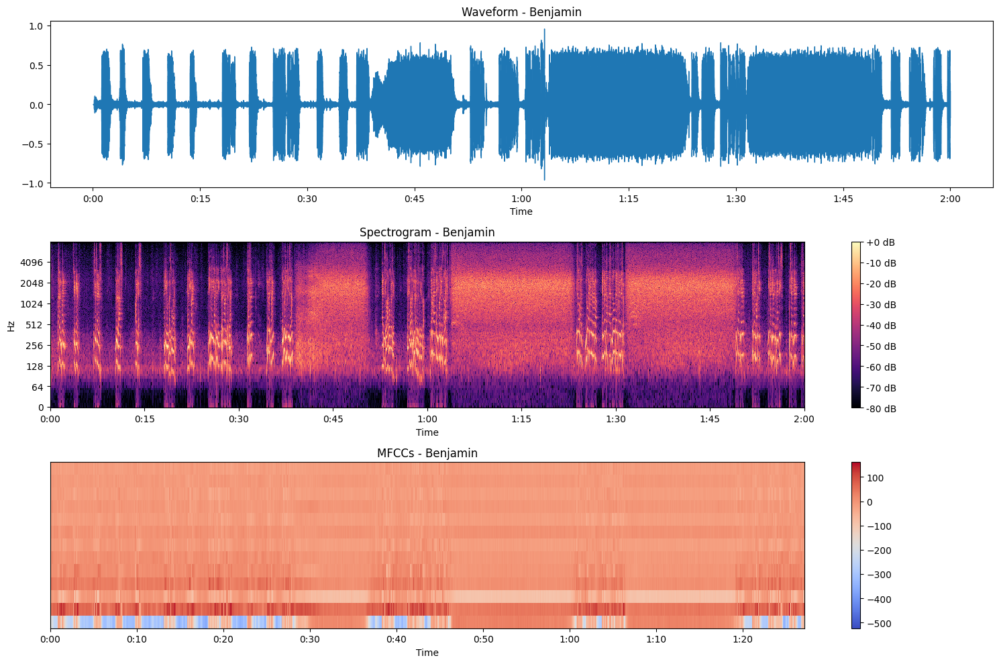

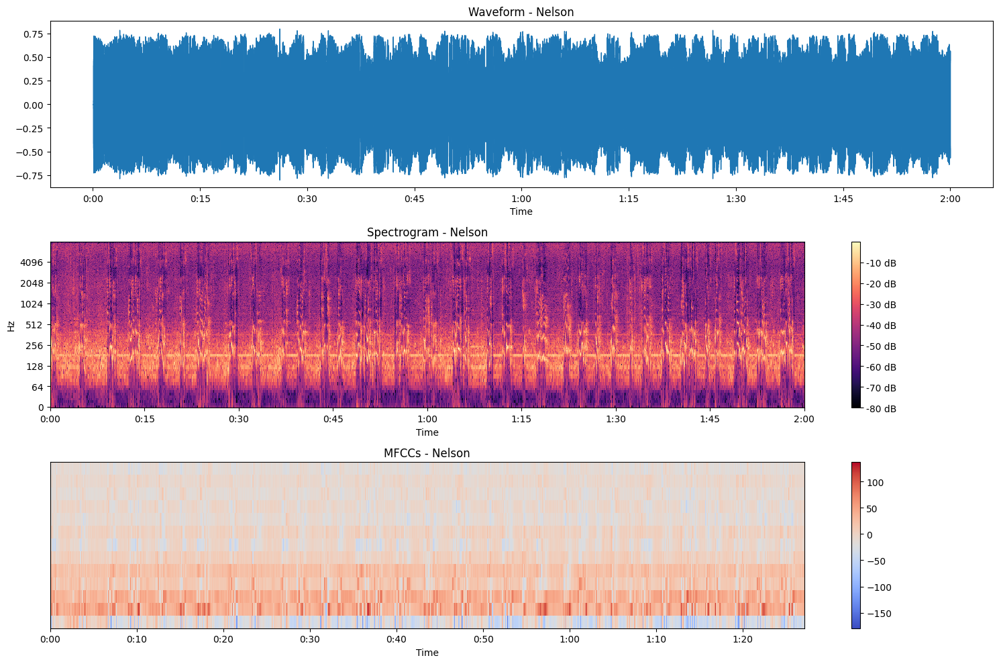

In [7]:
def plot_audio_features(audio_path):
    y, sr = librosa.load(audio_path, sr=None)
    speaker_name = os.path.basename(audio_path).split('_')[0]
    plt.figure(figsize=(15, 10))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {speaker_name}')
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {speaker_name}')
    plt.subplot(3, 1, 3)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {speaker_name}')
    plt.tight_layout()
    plt.show()
audio_paths = [
    '/content/combined_files/Benjamin_Netanyau_combined.wav',
    '/content/combined_files/Nelson_Mandela_combined.wav'
]

for audio_path in audio_paths:
    plot_audio_features(audio_path)

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

parent_dir = "/content/drive/MyDrive/16000_pcm_speeches"

speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]

def extract_features(parent_dir, speaker_folders):
    features = []
    labels = []

    for i, speaker_folder in enumerate(speaker_folders):
        speaker_folder_path = os.path.join(parent_dir, speaker_folder)

        for filename in os.listdir(speaker_folder_path):
            if filename.endswith(".wav"):
                file_path = os.path.join(speaker_folder_path, filename)
                audio, sr = librosa.load(file_path, sr=None, duration=1)
                mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)
                mfccs_normalized = StandardScaler().fit_transform(mfccs.T)
                features.append(mfccs_normalized)
                labels.append(i)
    return np.array(features), np.array(labels)
X, y = extract_features(parent_dir, speaker_folders)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Features shape:", X.shape)
print("Labels shape:", y.shape)

Features shape: (7511, 32, 13)
Labels shape: (7511,)


In [9]:
for feature in X[:1]:
    print(feature)

[[-4.3913403e+00  2.5965488e+00  1.6602116e+00  2.2292213e-01
   1.1533986e+00  2.1547451e+00  2.2480998e+00  1.3378707e+00
   1.2978898e+00  3.0054040e+00 -3.5985753e-01 -8.6834639e-01
  -4.1552639e-01]
 [-3.4295436e-02  1.1819013e+00  9.5422167e-01 -2.0071578e-01
   4.3402314e-01  8.3062458e-01  1.0447840e-01  7.9353285e-01
   6.2941319e-01  1.7183468e+00 -2.3722284e-02 -2.3318973e+00
  -2.6584655e-01]
 [ 2.5312081e-01  9.3228364e-01 -2.7642839e-03 -6.5158027e-01
  -6.2563610e-01 -2.4224921e-01 -8.0956835e-01  5.0212502e-01
  -1.7751595e-03  1.0420500e-02 -3.9246947e-01 -7.3928273e-01
   1.8796001e-01]
 [ 1.0123198e+00  1.0202591e+00  1.1772467e+00  1.4063743e-03
   4.7760913e-01  1.0478446e+00 -9.2122585e-02  1.3389684e-01
  -1.3456208e+00 -1.7697777e-01 -5.5247778e-01 -2.1146989e-01
  -7.1365148e-02]
 [ 1.1379938e+00  5.0056916e-01 -1.6879068e-01 -2.3324816e-01
  -3.2496941e-01  1.0406344e+00  4.8578534e-01  3.9570516e-01
   7.7787983e-01  2.7992040e-01 -4.9222201e-01 -9.8980345e-0

In [10]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[]


In [11]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
label_encoder.classes_ = np.array(speaker_folders)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)
print("Training Data Shape:", X_train.shape)
print("Validation Data Shape:", X_val.shape)

Training Data Shape: (5257, 32, 13)
Validation Data Shape: (1127, 32, 13)


Epoch 1/20
165/165 [==============================] - 14s 57ms/step - loss: 1.2981 - accuracy: 0.4664 - val_loss: 0.9021 - val_accuracy: 0.6522
Epoch 2/20
165/165 [==============================] - 11s 66ms/step - loss: 0.7709 - accuracy: 0.7084 - val_loss: 0.7347 - val_accuracy: 0.7249
Epoch 3/20
165/165 [==============================] - 8s 48ms/step - loss: 0.5855 - accuracy: 0.7837 - val_loss: 0.5912 - val_accuracy: 0.7773
Epoch 4/20
165/165 [==============================] - 11s 64ms/step - loss: 0.4587 - accuracy: 0.8309 - val_loss: 0.5490 - val_accuracy: 0.7924
Epoch 5/20
165/165 [==============================] - 8s 46ms/step - loss: 0.3877 - accuracy: 0.8579 - val_loss: 0.5223 - val_accuracy: 0.8208
Epoch 6/20
165/165 [==============================] - 11s 66ms/step - loss: 0.3333 - accuracy: 0.8786 - val_loss: 0.5027 - val_accuracy: 0.8154
Epoch 7/20
165/165 [==============================] - 9s 53ms/step - loss: 0.2931 - accuracy: 0.8918 - val_loss: 0.4976 - val_accuracy: 0.

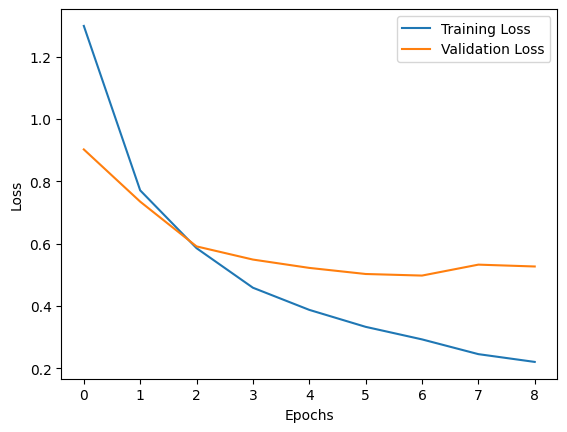

In [12]:
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(speaker_folders), activation='softmax')
])
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32, callbacks=[early_stopping])
if early_stopping.stopped_epoch > 0:
    print("Early stopping triggered at epoch", early_stopping.stopped_epoch + 1)
else:
    print("Training completed without early stopping")
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

36/36 [==============================] - 1s 17ms/step
Test Evaluation Accuracy: 0.8198757763975155
Weighted F1 Score: 0.8196879549898949


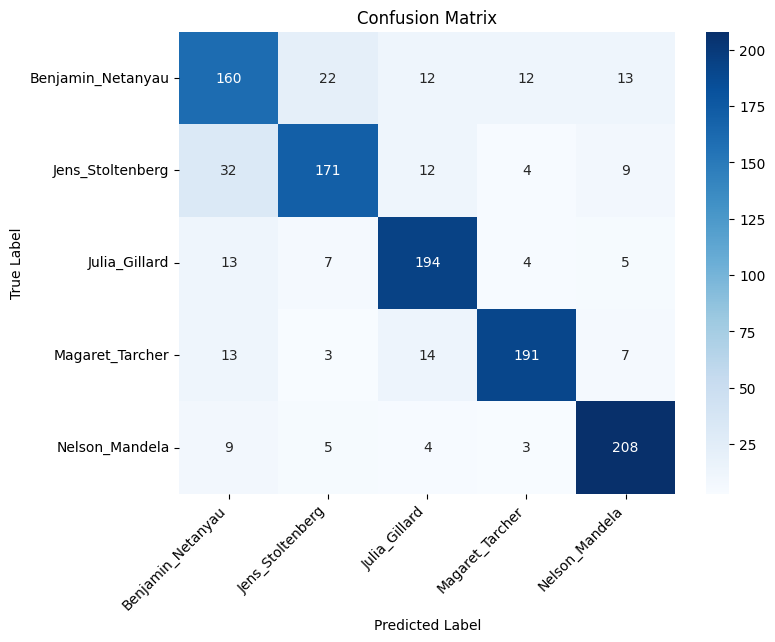

In [13]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score
y_pred_probabilities = model.predict(X_test)
y_pred = np.argmax(y_pred_probabilities, axis=1)
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded, labels=speaker_folders)
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Evaluation Accuracy: {accuracy}")
f1 = f1_score(y_test_decoded, y_pred_decoded, labels=speaker_folders, average='weighted')
print(f"Weighted F1 Score: {f1}")
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=speaker_folders, yticklabels=speaker_folders)
plt.xticks(rotation=45, ha="right")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()